In [1]:
# Imports
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
import seaborn as sns
import sklearn
import numpy as np

In [2]:
# Import data
data = pd.read_excel('Base Model_2019_ML_Ashiqur.xlsx', sheet_name='Base Model')

print(data.head())

   Bridge_Number  Steel_Element         CS1  CS2       CS3  CS4  temp_dp_2m  \
0          10029             28  100.000000  0.0  0.000000  0.0     19.6859   
1          10029             29   92.592593  0.0  7.407407  0.0     19.6859   
2          10029            107   99.725746  0.0  0.274254  0.0     19.6859   
3          10029            113   97.397066  0.0  2.602934  0.0     19.6859   
4          10029            152   98.630137  0.0  1.369863  0.0     19.6859   

   avg_rh_2m  temp_a_10m  temp_a_2m  ...  DECK_STRUCTURE_TYPE_107  \
0  82.387398      22.962    23.2285  ...                        1   
1  82.387398      22.962    23.2285  ...                        1   
2  82.387398      22.962    23.2285  ...                        1   
3  82.387398      22.962    23.2285  ...                        1   
4  82.387398      22.962    23.2285  ...                        1   

   SURFACE_TYPE_108A  MEMBRANE_TYPE_108B  DECK_PROTECTION_108C  \
0                  0                   0    

In [3]:
# data = data[data['Steel_Element'] == 107] 
# data = data.reset_index(drop=True) 
env_nbe_nbi_df = data[[
#     'CS1', 'CS2', 'CS3', 'CS4',
       'temp_dp_2m', 'avg_rh_2m', 'temp_a_10m', 'temp_a_2m', 'temp_a_60c',
       'temp_s_2cm', 'ppt_2019', 'hplus_2019', 'SO4_2019', 'Cl_2019',
       'totalN_201', 'NO3_2019', 'NH4_2019', 'Na_2019', 'K_2019', 'Mg_2019',
       'Ca_2019', 'MAINTENANCE_021', 'Bridge_Age', 'ADT_029',
       'DEGREES_SKEW_034', 'SERVICE_ON_042A', 'SERVICE_UND_042B',
       'STRUCTURE_KIND_043A', 'STRUCTURE_TYPE_043B', 'APPR_KIND_044A',
       'APPR_TYPE_044B', 'DECK_COND_058', 'SUPERSTRUCTURE_COND_059',
       'SUBSTRUCTURE_COND_060', 'OPERATING_RATING_064', 'INVENTORY_RATING_066',
       'STRUCTURAL_EVAL_067', 'APPR_ROAD_EVAL_072', 'DECK_STRUCTURE_TYPE_107',
       'SURFACE_TYPE_108A', 'MEMBRANE_TYPE_108B', 'DECK_PROTECTION_108C',
       'PERCENT_ADT_TRUCK_109','BRIDGE_CONDITION','Label_CS1','Label_CS2','Label_CS3','Label_CS4']]
print(env_nbe_nbi_df)


      temp_dp_2m  avg_rh_2m  temp_a_10m  temp_a_2m  temp_a_60c  temp_s_2cm  \
0      19.685900  82.387398   22.962000  23.228500   22.967199   24.785700   
1      19.685900  82.387398   22.962000  23.228500   22.967199   24.785700   
2      19.685900  82.387398   22.962000  23.228500   22.967199   24.785700   
3      19.685900  82.387398   22.962000  23.228500   22.967199   24.785700   
4      19.685900  82.387398   22.962000  23.228500   22.967199   24.785700   
...          ...        ...         ...        ...         ...         ...   
1984   19.585699  83.140503   22.971500  22.977100   23.061100   25.712799   
1985   19.672400  83.119698   23.051500  23.061199   23.135099   25.721800   
1986   19.553200  83.076103   22.979099  22.962000   23.046801   25.565800   
1987   19.553200  83.076103   22.979099  22.962000   23.046801   25.565800   
1988   19.585699  83.140503   22.971500  22.977100   23.061100   25.712799   

        ppt_2019  hplus_2019  SO4_2019   Cl_2019  ...  \
0     

In [4]:
env_nbe_nbi_df.head()

,temp_dp_2m,avg_rh_2m,temp_a_10m,temp_a_2m,temp_a_60c,temp_s_2cm,ppt_2019,hplus_2019,SO4_2019,Cl_2019,...,DECK_STRUCTURE_TYPE_107,SURFACE_TYPE_108A,MEMBRANE_TYPE_108B,DECK_PROTECTION_108C,PERCENT_ADT_TRUCK_109,BRIDGE_CONDITION,Label_CS1,Label_CS2,Label_CS3,Label_CS4
0,19.6859,82.387398,22.962,23.2285,22.967199,24.7857,144.593002,0.11837,6.12682,7.79553,...,1,0,0,0,5,1,1,0,0,0
1,19.6859,82.387398,22.962,23.2285,22.967199,24.7857,144.593002,0.11837,6.12682,7.79553,...,1,0,0,0,5,1,1,0,0,0
2,19.6859,82.387398,22.962,23.2285,22.967199,24.7857,144.593002,0.11837,6.12682,7.79553,...,1,0,0,0,5,1,1,0,0,0
3,19.6859,82.387398,22.962,23.2285,22.967199,24.7857,144.593002,0.11837,6.12682,7.79553,...,1,0,0,0,5,1,1,0,0,0
4,19.6859,82.387398,22.962,23.2285,22.967199,24.7857,144.593002,0.11837,6.12682,7.79553,...,1,0,0,0,5,1,1,0,0,0


In [5]:
dataset = env_nbe_nbi_df.values
bridge_data = dataset[:,:-4]
cs1_label = data['Label_CS1']
cs2_label = data['Label_CS2']
cs3_label = data['Label_CS3']
cs4_label = data['Label_CS4']

In [6]:
env_nbe_nbi_df.columns
feature_columns = ['temp_dp_2m', 'avg_rh_2m', 'temp_a_10m', 'temp_a_2m', 'temp_a_60c',
       'temp_s_2cm', 'ppt_2019', 'hplus_2019', 'SO4_2019', 'Cl_2019',
       'totalN_201', 'NO3_2019', 'NH4_2019', 'Na_2019', 'K_2019', 'Mg_2019',
       'Ca_2019', 'MAINTENANCE_021', 'Bridge_Age', 'ADT_029',
       'DEGREES_SKEW_034', 'SERVICE_ON_042A', 'SERVICE_UND_042B',
       'STRUCTURE_KIND_043A', 'STRUCTURE_TYPE_043B', 'APPR_KIND_044A',
       'APPR_TYPE_044B', 'DECK_COND_058', 'SUPERSTRUCTURE_COND_059',
       'SUBSTRUCTURE_COND_060', 'OPERATING_RATING_064', 'INVENTORY_RATING_066',
       'STRUCTURAL_EVAL_067', 'APPR_ROAD_EVAL_072', 'DECK_STRUCTURE_TYPE_107',
       'SURFACE_TYPE_108A', 'MEMBRANE_TYPE_108B', 'DECK_PROTECTION_108C',
       'PERCENT_ADT_TRUCK_109','BRIDGE_CONDITION']

In [7]:
len(cs4_label)

1989

In [8]:
# Train
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image  
import pydotplus

from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.feature_extraction import DictVectorizer
from sklearn.model_selection import train_test_split
from sklearn import metrics

from matplotlib.pyplot import figure
import seaborn as sns

topn = 15


# 1. Decision Tree for CS1

In [9]:
X_train, X_test, y_train, y_test = train_test_split(bridge_data, cs1_label, test_size=0.3, random_state=1) 

# max_depth
clf = tree.DecisionTreeClassifier(criterion='gini')
clf = clf.fit(X_train,y_train)
y_pred = clf.predict(X_test)


In [10]:
print("Decision Tree for CS1 Accuracy:",metrics.accuracy_score(y_test, y_pred))
print("Decision Tree for CS1 Recall:",metrics.recall_score(y_test, y_pred))

Decision Tree for CS1 Accuracy: 0.8324958123953099
Decision Tree for CS1 Recall: 0.8903225806451613


In [11]:
# Decision Tree in Sklearn

# Decision tree algorithm with Gini Impurity as a criterion to measure the split.
# Gini impurity can be understood as a criterion to minimize the probability of misclassification.
# Gini:
# 1- (334/1392)^2 - (1058/1392)^2 = 0.365

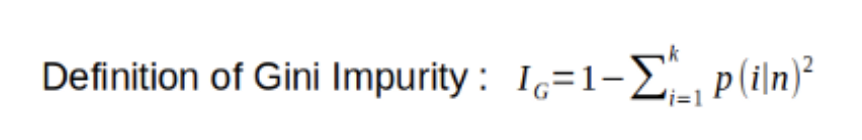

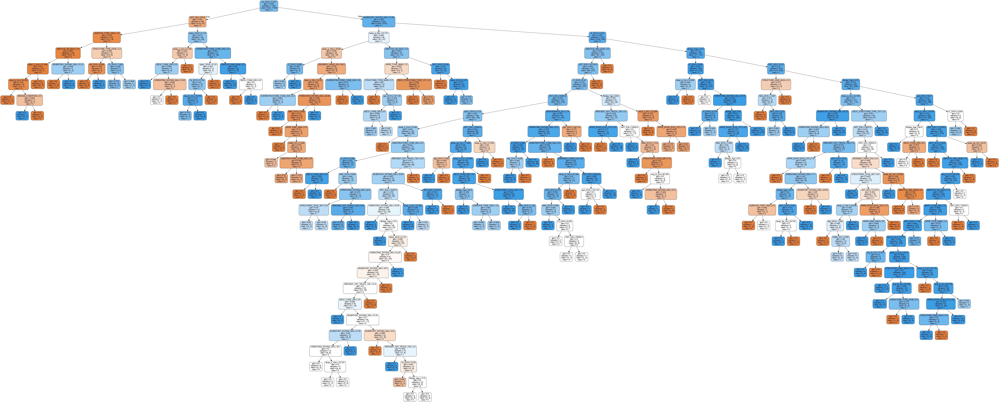

In [12]:
pic_name = 'DecisionTreeCS1.png'
dot_data = StringIO()
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(pic_name)
Image(graph.create_png())


# value = [334, 1058] means: 334 out of 1392 of class 0, 1058 out of 1392 of class 1

## 1.1 Top N Decision Tree important features of CS1 

In [13]:
decision_tree_feature_imp1 = pd.Series(clf.feature_importances_,index=feature_columns).sort_values(ascending=False)[:topn]
decision_tree_feature_imp1

Ca_2019                  0.227336
ADT_029                  0.164277
INVENTORY_RATING_066     0.063684
K_2019                   0.053554
Bridge_Age               0.051853
NH4_2019                 0.028007
temp_a_2m                0.026495
temp_a_10m               0.025272
OPERATING_RATING_064     0.024916
PERCENT_ADT_TRUCK_109    0.024078
hplus_2019               0.023019
temp_s_2cm               0.020694
SERVICE_ON_042A          0.020061
SERVICE_UND_042B         0.019532
temp_a_60c               0.017385
dtype: float64

No handles with labels found to put in legend.


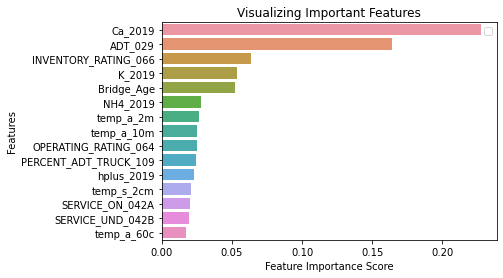

In [14]:
# Creating a bar plot
sns.barplot(x=decision_tree_feature_imp1, y=decision_tree_feature_imp1.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

## 1.2 Prediction using TopN Feature

In [15]:
decision_tree_CS1_feature_columns_selection = decision_tree_feature_imp1.index

In [16]:
env_nbe_nbi_df_decision_tree_cs1_selection = data[decision_tree_CS1_feature_columns_selection]
print(env_nbe_nbi_df_decision_tree_cs1_selection)

      Ca_2019  ADT_029  INVENTORY_RATING_066    K_2019  Bridge_Age  NH4_2019  \
0     1.34667    10000                  34.5  0.444740          56   1.43818   
1     1.34667    10000                  34.5  0.444740          56   1.43818   
2     1.34667    10000                  34.5  0.444740          56   1.43818   
3     1.34667    10000                  34.5  0.444740          56   1.43818   
4     1.34667    10000                  34.5  0.444740          56   1.43818   
...       ...      ...                   ...       ...         ...       ...   
1984  1.38742    20150                  32.4  0.969669          62   1.66467   
1985  1.41171    24317                  42.1  1.041050          65   1.72314   
1986  1.37360    29307                  34.9  0.928418          44   1.63090   
1987  1.37360    27251                  34.9  0.928418          44   1.63090   
1988  1.38742    20150                  32.4  0.969669          65   1.66467   

      temp_a_2m  temp_a_10m  OPERATING_

In [17]:
dataset_decision_tree_cs1_selection = env_nbe_nbi_df_decision_tree_cs1_selection.values
decision_tree_cs1_bridge_data_selection = dataset_decision_tree_cs1_selection

X_train_topn_feature1, X_test_topn_feature1, y_train_topn_feature1, y_test_topn_feature1 = train_test_split(decision_tree_cs1_bridge_data_selection, cs1_label, test_size=0.3, random_state=1) 
clf1_top = tree.DecisionTreeClassifier(criterion='gini')
clf1_top = clf1_top.fit(X_train_topn_feature1,y_train_topn_feature1)
y_pred_selection1 = clf1_top.predict(X_test_topn_feature1)


In [18]:
print("Decision Tree Prediction using TopN Feature Accuracy:",metrics.accuracy_score(y_test, y_pred_selection1))
print("Decision Tree Prediction using TopN Feature Recall:",metrics.recall_score(y_test, y_pred_selection1))

Decision Tree Prediction using TopN Feature Accuracy: 0.8241206030150754
Decision Tree Prediction using TopN Feature Recall: 0.8881720430107527


## 1.3 Random Forest for CS1

In [19]:
#Import Random Forest Model
from sklearn.ensemble import RandomForestClassifier

#Create a Gaussian Classifier
clf_random=RandomForestClassifier(n_estimators=100)

clf_random.fit(X_train,y_train)

y_pred_random=clf_random.predict(X_test)
print("Random Forest for CS1 Accuracy:",metrics.accuracy_score(y_test, y_pred_random))
print("Random Forest for CS1 Recall:",metrics.recall_score(y_test, y_pred_random))

Random Forest for CS1 Accuracy: 0.864321608040201
Random Forest for CS1 Recall: 0.9311827956989247


In [20]:
fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (20,10), dpi=900)

for index in range(0, 5):
    tree.plot_tree(clf_random.estimators_[index],
                   feature_names = feature_columns, 
                   class_names=['0','1'],
                   filled = True,
                   ax = axes[index]);

    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
fig.savefig('rf_5trees.png')

## 1.4 Top N Random Forest important feature of CS1 

No handles with labels found to put in legend.


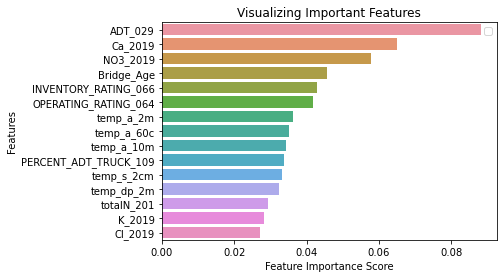

In [21]:
random_forest_feature_imp = pd.Series(clf_random.feature_importances_,index=feature_columns).sort_values(ascending=False)[:topn]

# Creating a bar plot
sns.barplot(x=random_forest_feature_imp, y=random_forest_feature_imp.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

## 1.5 Predict Random Frests top N feature of CS1

In [22]:
random_forest_cs1_feature_columns_selection = random_forest_feature_imp.index
env_nbe_nbi_df_selection_random_forest_cs1 = data[random_forest_cs1_feature_columns_selection]
print(env_nbe_nbi_df_selection_random_forest_cs1)

      ADT_029  Ca_2019  NO3_2019  Bridge_Age  INVENTORY_RATING_066  \
0       10000  1.34667   7.68722          56                  34.5   
1       10000  1.34667   7.68722          56                  34.5   
2       10000  1.34667   7.68722          56                  34.5   
3       10000  1.34667   7.68722          56                  34.5   
4       10000  1.34667   7.68722          56                  34.5   
...       ...      ...       ...         ...                   ...   
1984    20150  1.38742   7.09509          62                  32.4   
1985    24317  1.41171   7.06210          65                  42.1   
1986    29307  1.37360   7.11498          44                  34.9   
1987    27251  1.37360   7.11498          44                  34.9   
1988    20150  1.38742   7.09509          65                  32.4   

      OPERATING_RATING_064  temp_a_2m  temp_a_60c  temp_a_10m  \
0                     38.6  23.228500   22.967199   22.962000   
1                     38.6  2

In [23]:
dataset_selection_random_forest_cs1 = env_nbe_nbi_df_selection_random_forest_cs1.values
bridge_data_selection_random_forest_cs1 = dataset_selection_random_forest_cs1

X_train_random_forest_cs1, X_test_random_forest_cs1, y_train_random_forest_cs1, y_test_random_forest_cs1 = train_test_split(bridge_data_selection_random_forest_cs1, cs1_label, test_size=0.3, random_state=1) 

clf_random1=RandomForestClassifier(n_estimators=100)

clf_random1.fit(X_train_random_forest_cs1,y_train_random_forest_cs1)

y_pred_random1=clf_random1.predict(X_test_random_forest_cs1)

print("Predict Random Frests top N feature of CS1 Accuracy:",metrics.accuracy_score(y_test_random_forest_cs1, y_pred_random1))
print("Predict Random Frests top N feature of CS1 Recall:",metrics.recall_score(y_test_random_forest_cs1, y_pred_random1))


Predict Random Frests top N feature of CS1 Accuracy: 0.8592964824120602
Predict Random Frests top N feature of CS1 Recall: 0.9268817204301075


# 2. Decision Tree for CS2

In [24]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(bridge_data, cs2_label, test_size=0.3, random_state=1) 
clf2 = tree.DecisionTreeClassifier(criterion='gini')
clf2 = clf2.fit(X_train2,y_train2)
y_pred2 = clf2.predict(X_test2)

In [25]:
print("Decision Tree for CS2 Accuracy:",metrics.accuracy_score(y_test2, y_pred2))
print("Decision Tree for CS2 Recall:",metrics.recall_score(y_test2, y_pred2))

Decision Tree for CS2 Accuracy: 0.8693467336683417
Decision Tree for CS2 Recall: 0.38


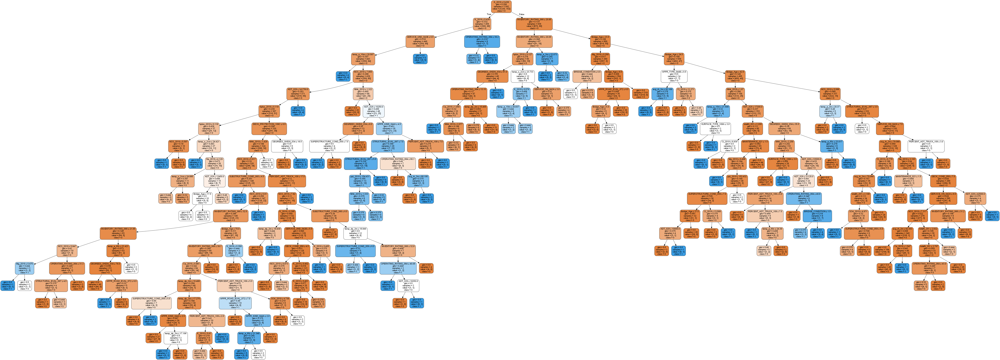

In [26]:
pic_name = 'DecisionTreeCS2.png'
dot_data = StringIO()
export_graphviz(clf2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(pic_name)
Image(graph.create_png())

## 2.1 Top N Decision Tree important features of CS2

In [27]:
decision_tree_feature_imp_cs2 = pd.Series(clf2.feature_importances_,index=feature_columns).sort_values(ascending=False)[:topn]
decision_tree_feature_imp_cs2


K_2019                     0.102248
ADT_029                    0.101587
INVENTORY_RATING_066       0.072429
NO3_2019                   0.068017
NH4_2019                   0.066762
Bridge_Age                 0.056613
DEGREES_SKEW_034           0.048527
PERCENT_ADT_TRUCK_109      0.046672
hplus_2019                 0.032760
SERVICE_UND_042B           0.030059
temp_dp_2m                 0.028091
SUPERSTRUCTURE_COND_059    0.027430
temp_a_10m                 0.025642
APPR_KIND_044A             0.024769
SUBSTRUCTURE_COND_060      0.024288
dtype: float64

No handles with labels found to put in legend.


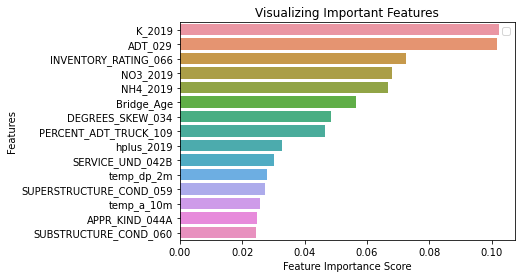

In [28]:
# Creating a bar plot
sns.barplot(x=decision_tree_feature_imp_cs2, y=decision_tree_feature_imp_cs2.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

## 2.2 Prediction Decision Tree using TopN Feature of CS2

In [29]:
decision_tree_CS2_feature_columns_selection = decision_tree_feature_imp_cs2.index
env_nbe_nbi_df_decision_tree_cs2_selection = data[decision_tree_CS2_feature_columns_selection]
print(env_nbe_nbi_df_decision_tree_cs2_selection)

        K_2019  ADT_029  INVENTORY_RATING_066  NO3_2019  NH4_2019  Bridge_Age  \
0     0.444740    10000                  34.5   7.68722   1.43818          56   
1     0.444740    10000                  34.5   7.68722   1.43818          56   
2     0.444740    10000                  34.5   7.68722   1.43818          56   
3     0.444740    10000                  34.5   7.68722   1.43818          56   
4     0.444740    10000                  34.5   7.68722   1.43818          56   
...        ...      ...                   ...       ...       ...         ...   
1984  0.969669    20150                  32.4   7.09509   1.66467          62   
1985  1.041050    24317                  42.1   7.06210   1.72314          65   
1986  0.928418    29307                  34.9   7.11498   1.63090          44   
1987  0.928418    27251                  34.9   7.11498   1.63090          44   
1988  0.969669    20150                  32.4   7.09509   1.66467          65   

      DEGREES_SKEW_034  PER

In [30]:
dataset_decision_tree_cs2_selection = env_nbe_nbi_df_decision_tree_cs2_selection.values
decision_tree_cs2_bridge_data_selection = dataset_decision_tree_cs2_selection

X_train_topn_feature2, X_test_topn_feature2, y_train_topn_feature2, y_test_topn_feature2 = train_test_split(decision_tree_cs2_bridge_data_selection, cs2_label, test_size=0.3, random_state=1) 
clf2_top = tree.DecisionTreeClassifier(criterion='gini')
clf2_top = clf2_top.fit(X_train_topn_feature2,y_train_topn_feature2)
y_pred_selection2 = clf2_top.predict(X_test_topn_feature2)


In [31]:
print("Prediction Decision Tree using TopN Feature of CS2 Accuracy:",metrics.accuracy_score(y_test_topn_feature2, y_pred_selection2))
print("Prediction Decision Tree using TopN Feature of CS2 Recall:",metrics.recall_score(y_test_topn_feature2, y_pred_selection2))

Prediction Decision Tree using TopN Feature of CS2 Accuracy: 0.8659966499162479
Prediction Decision Tree using TopN Feature of CS2 Recall: 0.32


## 2.3 Random Forest for CS2

In [32]:
clf_random2=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf_random2.fit(X_train2,y_train2)

y_pred_random2=clf_random2.predict(X_test2)
print("Random Forest for CS2 Accuracy:",metrics.accuracy_score(y_test2, y_pred_random2))
print("Random Forest for CS2 Recall:",metrics.recall_score(y_test2, y_pred_random2))

Random Forest for CS2 Accuracy: 0.9061976549413735
Random Forest for CS2 Recall: 0.36


## 2.4 Top N Random Forest important feature of CS2

No handles with labels found to put in legend.


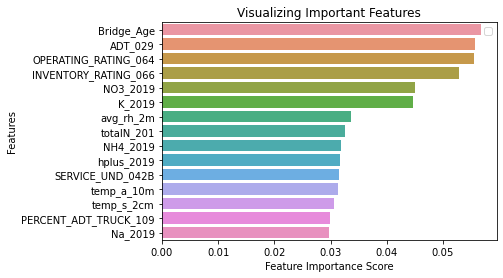

In [33]:
random_forest_feature_imp2 = pd.Series(clf_random2.feature_importances_,index=feature_columns).sort_values(ascending=False)[:topn]

# Creating a bar plot
sns.barplot(x=random_forest_feature_imp2, y=random_forest_feature_imp2.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

## 2.5 Predict Random Frests top N feature of CS2

In [34]:
random_forest_cs2_feature_columns_selection = random_forest_feature_imp2.index
env_nbe_nbi_df_selection_random_forest_cs2 = data[random_forest_cs2_feature_columns_selection]
print(env_nbe_nbi_df_selection_random_forest_cs2)

      Bridge_Age  ADT_029  OPERATING_RATING_064  INVENTORY_RATING_066  \
0             56    10000                  38.6                  34.5   
1             56    10000                  38.6                  34.5   
2             56    10000                  38.6                  34.5   
3             56    10000                  38.6                  34.5   
4             56    10000                  38.6                  34.5   
...          ...      ...                   ...                   ...   
1984          62    20150                  53.9                  32.4   
1985          65    24317                  70.2                  42.1   
1986          44    29307                  45.4                  34.9   
1987          44    27251                  45.4                  34.9   
1988          65    20150                  53.9                  32.4   

      NO3_2019    K_2019  avg_rh_2m  totalN_201  NH4_2019  hplus_2019  \
0      7.68722  0.444740  82.387398     2.85422   

In [35]:
dataset_selection_random_forest_cs2 = env_nbe_nbi_df_selection_random_forest_cs2.values
bridge_data_selection_random_forest_cs2 = dataset_selection_random_forest_cs2

X_train_random_forest_cs2, X_test_random_forest_cs2, y_train_random_forest_cs2, y_test_random_forest_cs2 = train_test_split(bridge_data_selection_random_forest_cs2, cs2_label, test_size=0.3, random_state=1) 

clf_random2_topn =RandomForestClassifier(n_estimators=100)

clf_random2_topn.fit(X_train_random_forest_cs2,y_train_random_forest_cs2)

y_pred_random2=clf_random2_topn.predict(X_test_random_forest_cs2)

print("Predict Random Frests top N feature of CS2 Accuracy:",metrics.accuracy_score(y_test_random_forest_cs2, y_pred_random2))
print("Predict Random Frests top N feature of CS2 Recall:",metrics.recall_score(y_test_random_forest_cs2, y_pred_random2))


Predict Random Frests top N feature of CS2 Accuracy: 0.8961474036850922
Predict Random Frests top N feature of CS2 Recall: 0.32


# 3. Decision Tree for CS3

In [36]:
X_train3, X_test3, y_train3, y_test3 = train_test_split(bridge_data, cs3_label, test_size=0.3, random_state=1) 
clf3 = tree.DecisionTreeClassifier(criterion='gini')
clf3 = clf3.fit(X_train3,y_train3)
y_pred3 = clf3.predict(X_test3)

In [37]:
print("Decision Tree for CS3 Accuracy:",metrics.accuracy_score(y_test3, y_pred3))
print("Decision Tree for CS3 Recall:",metrics.recall_score(y_test3, y_pred3))

Decision Tree for CS3 Accuracy: 0.9380234505862647
Decision Tree for CS3 Recall: 0.23333333333333334


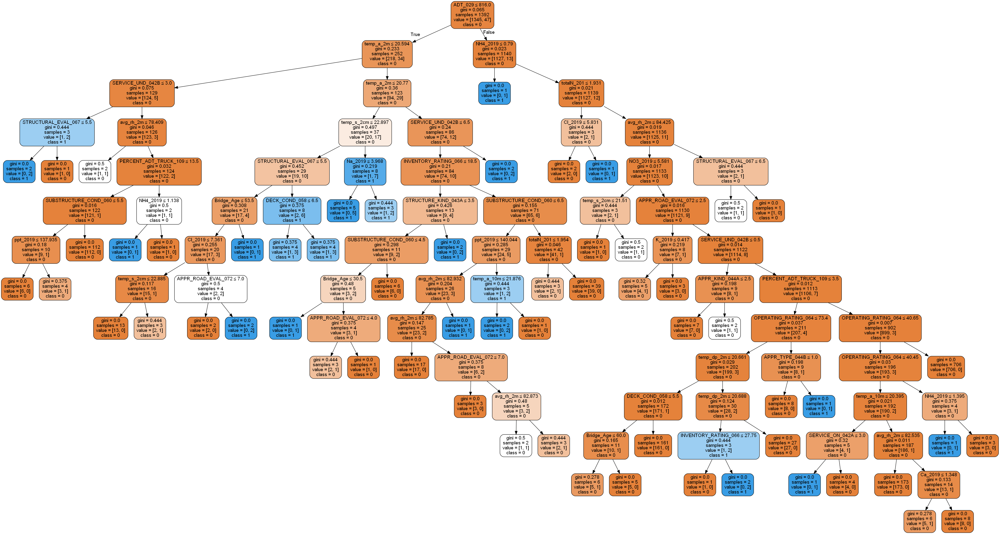

In [38]:
pic_name = 'DecisionTreeCS3.png'
dot_data = StringIO()
export_graphviz(clf3, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(pic_name)
Image(graph.create_png())

# ANNUAL AVERAGE DAILY TRAFFIC  ADT

## 3.1 Top N Decision Tree important features of CS3

In [39]:
decision_tree_feature_imp_cs3 = pd.Series(clf3.feature_importances_,index=feature_columns).sort_values(ascending=False)[:topn]
decision_tree_feature_imp_cs3


temp_a_2m                0.146049
ADT_029                  0.090314
SERVICE_UND_042B         0.081035
STRUCTURAL_EVAL_067      0.075925
NH4_2019                 0.063912
temp_s_2cm               0.063103
avg_rh_2m                0.058204
APPR_ROAD_EVAL_072       0.042845
temp_dp_2m               0.037134
Cl_2019                  0.036691
INVENTORY_RATING_066     0.034822
Bridge_Age               0.034818
STRUCTURE_KIND_043A      0.032495
ppt_2019                 0.027749
SUBSTRUCTURE_COND_060    0.026016
dtype: float64

No handles with labels found to put in legend.


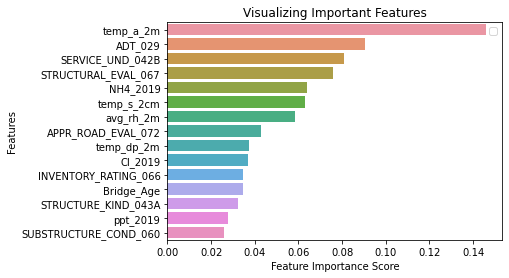

In [40]:
# Creating a bar plot
sns.barplot(x=decision_tree_feature_imp_cs3, y=decision_tree_feature_imp_cs3.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

## 3.2 Prediction Decision Tree using TopN Feature of CS3

In [41]:
decision_tree_CS3_feature_columns_selection = decision_tree_feature_imp_cs3.index
env_nbe_nbi_df_decision_tree_cs3_selection = data[decision_tree_CS3_feature_columns_selection]
print(env_nbe_nbi_df_decision_tree_cs3_selection)

      temp_a_2m  ADT_029  SERVICE_UND_042B  STRUCTURAL_EVAL_067  NH4_2019  \
0     23.228500    10000                 5                    5   1.43818   
1     23.228500    10000                 5                    5   1.43818   
2     23.228500    10000                 5                    5   1.43818   
3     23.228500    10000                 5                    5   1.43818   
4     23.228500    10000                 5                    5   1.43818   
...         ...      ...               ...                  ...       ...   
1984  22.977100    20150                 4                    7   1.66467   
1985  23.061199    24317                 9                    6   1.72314   
1986  22.962000    29307                 1                    8   1.63090   
1987  22.962000    27251                 1                    8   1.63090   
1988  22.977100    20150                 4                    7   1.66467   

      temp_s_2cm  avg_rh_2m  APPR_ROAD_EVAL_072  temp_dp_2m   Cl_2019  \
0 

In [42]:
dataset_decision_tree_cs3_selection = env_nbe_nbi_df_decision_tree_cs3_selection.values
decision_tree_cs3_bridge_data_selection = dataset_decision_tree_cs3_selection

X_train_topn_feature3, X_test_topn_feature3, y_train_topn_feature3, y_test_topn_feature3 = train_test_split(decision_tree_cs3_bridge_data_selection, cs3_label, test_size=0.3, random_state=1) 
clf3_top = tree.DecisionTreeClassifier(criterion='gini')
clf3_top = clf3_top.fit(X_train_topn_feature3,y_train_topn_feature3)
y_pred_selection3 = clf3_top.predict(X_test_topn_feature3)
print("Prediction Decision Tree using TopN Feature of CS3 Accuracy:",metrics.accuracy_score(y_test_topn_feature3, y_pred_selection3))
print("Prediction Decision Tree using TopN Feature of CS3 Recall:",metrics.recall_score(y_test_topn_feature3, y_pred_selection3))

Prediction Decision Tree using TopN Feature of CS3 Accuracy: 0.9514237855946399
Prediction Decision Tree using TopN Feature of CS3 Recall: 0.23333333333333334


## 3.3 Random Forest for CS3

In [43]:
clf_random3=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf_random3.fit(X_train3,y_train3)

y_pred_random3=clf_random3.predict(X_test3)

In [44]:
print("Random Forest for CS3 Accuracy:",metrics.accuracy_score(y_test3, y_pred_random3))
print("Random Forest for CS3 Recall:",metrics.recall_score(y_test3, y_pred_random3))

Random Forest for CS3 Accuracy: 0.9547738693467337
Random Forest for CS3 Recall: 0.26666666666666666


## 3.4 Top N Random Forest important feature of CS3

No handles with labels found to put in legend.


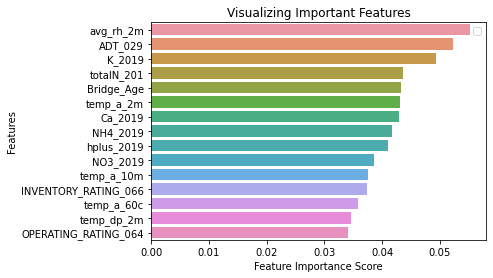

In [45]:
random_forest_feature_imp3 = pd.Series(clf_random3.feature_importances_,index=feature_columns).sort_values(ascending=False)[:topn]

# Creating a bar plot
sns.barplot(x=random_forest_feature_imp3, y=random_forest_feature_imp3.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

## 3.5 Predict Random Frests top N feature of CS3

In [46]:
random_forest_cs3_feature_columns_selection = random_forest_feature_imp3.index
env_nbe_nbi_df_selection_random_forest_cs3 = data[random_forest_cs3_feature_columns_selection]
print(env_nbe_nbi_df_selection_random_forest_cs3)

      avg_rh_2m  ADT_029    K_2019  totalN_201  Bridge_Age  temp_a_2m  \
0     82.387398    10000  0.444740     2.85422          56  23.228500   
1     82.387398    10000  0.444740     2.85422          56  23.228500   
2     82.387398    10000  0.444740     2.85422          56  23.228500   
3     82.387398    10000  0.444740     2.85422          56  23.228500   
4     82.387398    10000  0.444740     2.85422          56  23.228500   
...         ...      ...       ...         ...         ...        ...   
1984  83.140503    20150  0.969669     2.89642          62  22.977100   
1985  83.119698    24317  1.041050     2.93441          65  23.061199   
1986  83.076103    29307  0.928418     2.87466          44  22.962000   
1987  83.076103    27251  0.928418     2.87466          44  22.962000   
1988  83.140503    20150  0.969669     2.89642          65  22.977100   

      Ca_2019  NH4_2019  hplus_2019  NO3_2019  temp_a_10m  \
0     1.34667   1.43818    0.118370   7.68722   22.962000   
1

In [47]:
dataset_selection_random_forest_cs3 = env_nbe_nbi_df_selection_random_forest_cs3.values
bridge_data_selection_random_forest_cs3 = dataset_selection_random_forest_cs3

X_train_random_forest_cs3, X_test_random_forest_cs3, y_train_random_forest_cs3, y_test_random_forest_cs3 = train_test_split(bridge_data_selection_random_forest_cs3, cs3_label, test_size=0.3, random_state=1) 

clf_random3_topn =RandomForestClassifier(n_estimators=100)

clf_random3_topn.fit(X_train_random_forest_cs3,y_train_random_forest_cs3)

y_pred_random3=clf_random3_topn.predict(X_test_random_forest_cs3)

print("Predict Random Frests top N feature of CS3 Accuracy:",metrics.accuracy_score(y_test_random_forest_cs3, y_pred_random3))
print("Predict Random Frests top N feature of CS3 Recall:",metrics.recall_score(y_test_random_forest_cs3, y_pred_random3))


Predict Random Frests top N feature of CS3 Accuracy: 0.9547738693467337
Predict Random Frests top N feature of CS3 Recall: 0.23333333333333334


# 4. Decision Tree for CS4

In [48]:
X_train4, X_test4, y_train4, y_test4 = train_test_split(bridge_data, cs4_label, test_size=0.3, random_state=1) 
clf4 = tree.DecisionTreeClassifier(criterion='gini')
clf4 = clf4.fit(X_train4,y_train4)
y_pred4 = clf4.predict(X_test4)
print("Decision Tree for CS4 Accuracy:",metrics.accuracy_score(y_test4, y_pred4))
print("Decision Tree for CS4 Recall:",metrics.recall_score(y_test4, y_pred4))

Decision Tree for CS4 Accuracy: 0.9279731993299832
Decision Tree for CS4 Recall: 0.4883720930232558


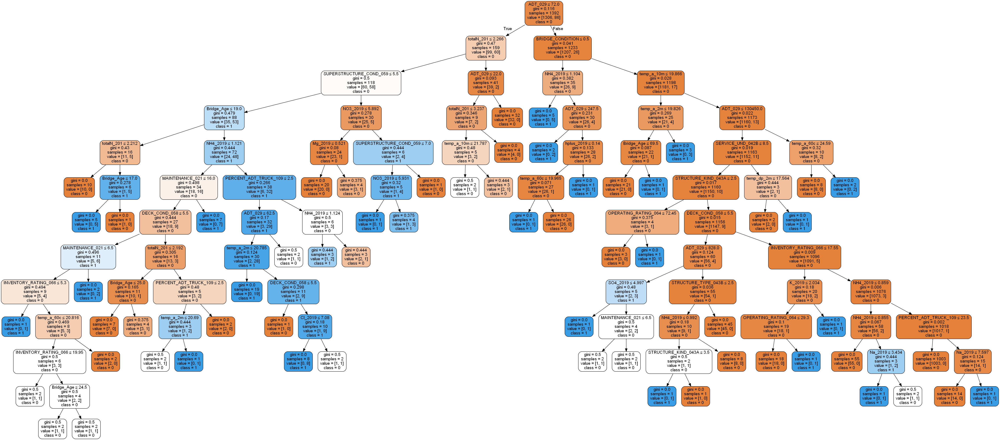

In [49]:
pic_name = 'DecisionTreeCS4.png'
dot_data = StringIO()
export_graphviz(clf4, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = feature_columns,class_names=['0','1'])
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png(pic_name)
Image(graph.create_png())

## 4.1 Top N Decision Tree important features of CS4

In [50]:
decision_tree_feature_imp_cs4 = pd.Series(clf4.feature_importances_,index=feature_columns).sort_values(ascending=False)[:topn]
decision_tree_feature_imp_cs4


ADT_029                    0.309316
totalN_201                 0.129522
NH4_2019                   0.106226
SUPERSTRUCTURE_COND_059    0.066893
Bridge_Age                 0.050240
MAINTENANCE_021            0.041654
temp_a_60c                 0.041127
temp_a_2m                  0.039229
BRIDGE_CONDITION           0.028098
NO3_2019                   0.026947
DECK_COND_058              0.025071
OPERATING_RATING_064       0.023760
PERCENT_ADT_TRUCK_109      0.020058
Na_2019                    0.015398
hplus_2019                 0.012517
dtype: float64

No handles with labels found to put in legend.


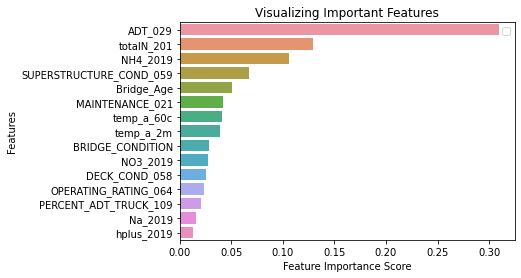

In [51]:
# Creating a bar plot
sns.barplot(x=decision_tree_feature_imp_cs4, y=decision_tree_feature_imp_cs4.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

## 4.2 Prediction Decision Tree using TopN Feature of CS4

In [52]:
decision_tree_CS4_feature_columns_selection = decision_tree_feature_imp_cs4.index
env_nbe_nbi_df_decision_tree_cs4_selection = data[decision_tree_CS4_feature_columns_selection]
print(env_nbe_nbi_df_decision_tree_cs4_selection)

      ADT_029  totalN_201  NH4_2019  SUPERSTRUCTURE_COND_059  Bridge_Age  \
0       10000     2.85422   1.43818                        5          56   
1       10000     2.85422   1.43818                        5          56   
2       10000     2.85422   1.43818                        5          56   
3       10000     2.85422   1.43818                        5          56   
4       10000     2.85422   1.43818                        5          56   
...       ...         ...       ...                      ...         ...   
1984    20150     2.89642   1.66467                        7          62   
1985    24317     2.93441   1.72314                        7          65   
1986    29307     2.87466   1.63090                        8          44   
1987    27251     2.87466   1.63090                        8          44   
1988    20150     2.89642   1.66467                        7          65   

      MAINTENANCE_021  temp_a_60c  temp_a_2m  BRIDGE_CONDITION  NO3_2019  \
0          

In [53]:
dataset_decision_tree_cs4_selection = env_nbe_nbi_df_decision_tree_cs4_selection.values
decision_tree_cs4_bridge_data_selection = dataset_decision_tree_cs4_selection

X_train_topn_feature4, X_test_topn_feature4, y_train_topn_feature4, y_test_topn_feature4 = train_test_split(decision_tree_cs4_bridge_data_selection, cs4_label, test_size=0.3, random_state=1) 
clf4_top = tree.DecisionTreeClassifier(criterion='gini')
clf4_top = clf4_top.fit(X_train_topn_feature4,y_train_topn_feature4)
y_pred_selection4 = clf4_top.predict(X_test_topn_feature4)
print("Prediction Decision Tree using TopN Feature of CS4 Accuracy:",metrics.accuracy_score(y_test_topn_feature4, y_pred_selection4))
print("Prediction Decision Tree using TopN Feature of CS4 Recall:",metrics.recall_score(y_test_topn_feature4, y_pred_selection4))

Prediction Decision Tree using TopN Feature of CS4 Accuracy: 0.9363484087102177
Prediction Decision Tree using TopN Feature of CS4 Recall: 0.5116279069767442


## 4.3 Random Forest for CS4

In [54]:
clf_random4=RandomForestClassifier(n_estimators=100)

#Train the model using the training sets y_pred=clf.predict(X_test)
clf_random4.fit(X_train4,y_train4)

y_pred_random4=clf_random4.predict(X_test4)
print("Random Forest for CS4 Accuracy:",metrics.accuracy_score(y_test4, y_pred_random4))
print("Random Forest for CS4 Recall:",metrics.recall_score(y_test4, y_pred_random4))

Random Forest for CS4 Accuracy: 0.9430485762144054
Random Forest for CS4 Recall: 0.5348837209302325


## 4.4 Top N Random Forest important feature of CS3

No handles with labels found to put in legend.


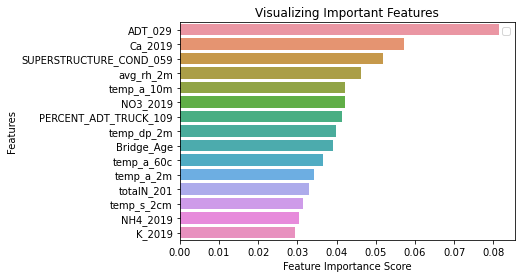

In [55]:
random_forest_feature_imp4 = pd.Series(clf_random4.feature_importances_,index=feature_columns).sort_values(ascending=False)[:topn]

# Creating a bar plot
sns.barplot(x=random_forest_feature_imp4, y=random_forest_feature_imp4.index)
# Add labels to your graph
plt.xlabel('Feature Importance Score')
plt.ylabel('Features')
plt.title("Visualizing Important Features")
plt.legend()
plt.show()

## 4.5 Predict Random Frests top N feature of CS4

In [56]:
random_forest_cs4_feature_columns_selection = random_forest_feature_imp4.index
env_nbe_nbi_df_selection_random_forest_cs4 = data[random_forest_cs4_feature_columns_selection]
print(env_nbe_nbi_df_selection_random_forest_cs4)

      ADT_029  Ca_2019  SUPERSTRUCTURE_COND_059  avg_rh_2m  temp_a_10m  \
0       10000  1.34667                        5  82.387398   22.962000   
1       10000  1.34667                        5  82.387398   22.962000   
2       10000  1.34667                        5  82.387398   22.962000   
3       10000  1.34667                        5  82.387398   22.962000   
4       10000  1.34667                        5  82.387398   22.962000   
...       ...      ...                      ...        ...         ...   
1984    20150  1.38742                        7  83.140503   22.971500   
1985    24317  1.41171                        7  83.119698   23.051500   
1986    29307  1.37360                        8  83.076103   22.979099   
1987    27251  1.37360                        8  83.076103   22.979099   
1988    20150  1.38742                        7  83.140503   22.971500   

      NO3_2019  PERCENT_ADT_TRUCK_109  temp_dp_2m  Bridge_Age  temp_a_60c  \
0      7.68722                    

In [57]:
dataset_selection_random_forest_cs4 = env_nbe_nbi_df_selection_random_forest_cs4.values
bridge_data_selection_random_forest_cs4 = dataset_selection_random_forest_cs4

X_train_random_forest_cs4, X_test_random_forest_cs4, y_train_random_forest_cs4, y_test_random_forest_cs4 = train_test_split(bridge_data_selection_random_forest_cs4, cs4_label, test_size=0.3, random_state=1) 

clf_random4_topn =RandomForestClassifier(n_estimators=100)

clf_random4_topn.fit(X_train_random_forest_cs4,y_train_random_forest_cs4)

y_pred_random4=clf_random4_topn.predict(X_test_random_forest_cs4)

print("Predict Random Frests top N feature of CS4 Accuracy:",metrics.accuracy_score(y_test_random_forest_cs4, y_pred_random4))
print("Predict Random Frests top N feature of CS4 Recall:",metrics.recall_score(y_test_random_forest_cs4, y_pred_random4))




Predict Random Frests top N feature of CS4 Accuracy: 0.9413735343383585
Predict Random Frests top N feature of CS4 Recall: 0.4883720930232558
